### Import paczek

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import shap

from sklearn.model_selection import train_test_split
from sklearn.inspection import plot_partial_dependence
from sklearn.metrics import confusion_matrix

import xgboost

import eli5
from eli5.sklearn import PermutationImportance

### Ładowanie danych treningowych

In [ ]:
train_data = pd.read_csv("final_train.csv")

## Opis danych

In [127]:
train_data.head()

,Unnamed: 0,Activity,"angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyAccMean,gravity)","angle(tBodyGyroJerkMean,gravityMean)","angle(tBodyGyroMean,gravityMean)",energy-mean(),"fBodyAcc-bandsEnergy()-1,16","fBodyAcc-bandsEnergy()-1,16.1","fBodyAcc-bandsEnergy()-1,16.2","fBodyAcc-bandsEnergy()-1,24","fBodyAcc-bandsEnergy()-1,24.1","fBodyAcc-bandsEnergy()-1,24.2","fBodyAcc-bandsEnergy()-1,8","fBodyAcc-bandsEnergy()-1,8.1","fBodyAcc-bandsEnergy()-1,8.2","fBodyAcc-bandsEnergy()-17,24","fBodyAcc-bandsEnergy()-17,24.1","fBodyAcc-bandsEnergy()-17,24.2","fBodyAcc-bandsEnergy()-17,32","fBodyAcc-bandsEnergy()-17,32.1","fBodyAcc-bandsEnergy()-17,32.2","fBodyAcc-bandsEnergy()-25,32","fBodyAcc-bandsEnergy()-25,32.1","fBodyAcc-bandsEnergy()-25,32.2","fBodyAcc-bandsEnergy()-25,48","fBodyAcc-bandsEnergy()-25,48.1","fBodyAcc-bandsEnergy()-25,48.2","fBodyAcc-bandsEnergy()-33,40","fBodyAcc-bandsEnergy()-33,40.1","fBodyAcc-bandsEnergy()-33,40.2","fBodyAcc-bandsEnergy()-33,48","fBodyAcc-bandsEnergy()-33,48.1","fBodyAcc-bandsEnergy()-33,48.2","fBodyAcc-bandsEnergy()-41,48","fBodyAcc-bandsEnergy()-41,48.1","fBodyAcc-bandsEnergy()-41,48.2",...,"tGravityAcc-correlation()-Y,Z",tGravityAcc-energy()-X,tGravityAcc-energy()-Y,tGravityAcc-energy()-Z,tGravityAcc-entropy()-X,tGravityAcc-entropy()-Y,tGravityAcc-entropy()-Z,tGravityAcc-iqr()-X,tGravityAcc-iqr()-Y,tGravityAcc-iqr()-Z,tGravityAcc-mad()-X,tGravityAcc-mad()-Y,tGravityAcc-mad()-Z,tGravityAcc-max()-X,tGravityAcc-max()-Y,tGravityAcc-max()-Z,tGravityAcc-mean()-X,tGravityAcc-mean()-Y,tGravityAcc-mean()-Z,tGravityAcc-min()-X,tGravityAcc-min()-Y,tGravityAcc-min()-Z,tGravityAcc-sma(),tGravityAcc-std()-X,tGravityAcc-std()-Y,tGravityAcc-std()-Z,tGravityAccMag-arCoeff()1,tGravityAccMag-arCoeff()2,tGravityAccMag-arCoeff()3,tGravityAccMag-arCoeff()4,tGravityAccMag-energy(),tGravityAccMag-entropy(),tGravityAccMag-iqr(),tGravityAccMag-mad(),tGravityAccMag-max(),tGravityAccMag-mean(),tGravityAccMag-min(),tGravityAccMag-sma(),tGravityAccMag-std(),void()
0,0,STANDING,-1.574191,-0.805700,-2.453831,-1.861714,0.115517,-2.023369,3.125860,-9.474436,3.622600,6.137246,2.503062,5.776680,3.242765,-1.352936,-1.537732,2.828395,8.603183,-2.228620,5.355308,3.987723,1.880228,1.384042,-2.163548,0.483175,2.942713,5.837147,2.957527,-1.770934,-5.580564,13.725027,1.724643,-0.519345,4.233416,0.953127,0.807692,2.624547,-3.005993,3.329588,...,2.988204,1.531084,-3.422785,1.852121,8.394366,3.246233,0.937300,4.725389,-1.578871,-0.442374,4.068593,4.705346,7.195449,-6.003664,0.607255,-1.499318,2.246320,2.861260,3.815614,-2.151051,-3.122438,-0.336110,6.357369,3.741996,1.394575,4.017211,2.481302,5.774536,1.754626,1.180533,5.049130,3.272281,5.103018,-0.823302,3.063681,-0.928676,-1.007695,3.094236,1.669987,1.0
1,1,WALKING_UPSTAIRS,-1.568669,-0.612620,-2.488338,-1.751117,0.218134,0.280294,7.953403,-0.679894,2.512880,5.740178,2.803435,5.484726,2.102368,-1.355854,-1.416568,2.527046,8.046001,-1.986672,5.284168,3.598328,1.892567,1.417711,-2.027475,0.436458,2.908602,5.819734,2.551773,-1.756530,-5.503246,13.251491,1.714753,-0.552312,3.566532,0.922455,0.726768,2.081277,-3.081267,3.140684,...,2.859864,1.585023,-3.387872,1.698743,8.112279,1.926083,2.348895,4.719540,-1.521161,-0.463599,4.063648,4.730261,7.221653,-5.789276,0.417687,-0.703212,2.488702,2.391994,5.884982,-2.187197,-3.306482,-0.814718,6.077734,3.720622,1.202847,4.050714,4.539801,4.618405,1.727481,0.220730,4.565443,4.440779,3.288399,-2.689605,1.705341,-0.822617,-0.572410,-2.187890,-0.544652,2.0
2,2,LAYING,-1.548333,-0.139628,-2.380889,-1.915239,0.067613,-0.887342,6.007361,-11.906904,3.621984,6.158630,2.495276,5.776843,3.314383,-1.352860,-1.537483,2.845718,8.618923,-2.232214,5.378175,3.998898,1.879989,1.372814,-2.169002,0.485317,2.957325,5.841023,2.974139,-1.775050,-5.600164,13.743085,1.726239,-0.505341,4.256780,0.957134,0.831419,2.640759,-2.999393,3.359696,...,3.717038,1.851578,-4.070744,1.220517,7.690866,3.055395,1.937417,4.6

In [3]:
features_to_accuracy = [[2, 0.7716333845366103],
 [3, 0.7680491551459293],
 [4, 0.7803379416282642],
 [5, 0.7767537122375832],
 [6, 0.7757296466973886],
 [7, 0.7992831541218638],
 [8, 0.7992831541218638],
 [9, 0.7951868919610855],
 [10, 0.8038914490527393],
 [11, 0.8033794162826421],
 [12, 0.8248847926267281],
 [13, 0.8197644649257553],
 [14, 0.8248847926267281],
 [15, 0.8361495135688684],
 [16, 0.8269329237071172],
 [17, 0.8330773169482847],
 [18, 0.8366615463389657],
 [19, 0.8484383000512032],
 [20, 0.8540706605222734],
 [21, 0.8540706605222734],
 [22, 0.8484383000512032],
 [23, 0.8576548899129545],
 [24, 0.8637992831541219],
 [25, 0.8668714797747056],
 [26, 0.8668714797747056],
 [27, 0.8658474142345111],
 [28, 0.8704557091653866],
 [29, 0.869431643625192],
 [40, 0.9452124935995904],
 [50, 0.9503328213005633],
 [60, 0.9482846902201741],
 [70, 0.9518689196108551],
 [80, 0.9559651817716334],
 [90, 0.956989247311828],
 [100, 0.9610855094726063],
 [110, 0.9605734767025089],
 [120, 0.9621095750128008],
 [130, 0.96415770609319],
 [140, 0.9667178699436764],
 [150, 0.9810547875064004],
 [160, 0.9836149513568868],
 [170, 0.985663082437276],
 [180, 0.9815668202764977],
 [190, 0.9805427547363031],
 [200, 0.9841269841269841],
 [210, 0.9825908858166923]]

df = pd.DataFrame(data=features_to_accuracy, columns = ['Liczba cech', 'Dokładność klasyfikacji']) 

from plotnine import ggplot, geom_line, aes, stat_smooth, facet_wrap, theme_classic, ggtitle
(ggplot(df, aes('Liczba cech', 'Dokładność klasyfikacji'))
 + ggtitle("Wpływ liczby cech na skuteczność modelu")
 + geom_line(colour="#C70039")
 + theme_classic())

ModuleNotFoundError: No module named 'plotnine'

In [128]:
train_data.drop(train_data[train_data['angle(X,gravityMean)'] > -1.554].index, axis=0, inplace=True)

In [129]:
cols = ['fBodyAccJerk-mad()-Z',
 'fBodyAccMag-meanFreq()',
 'tBodyAcc-arCoeff()-X,1',
 'tGravityAcc-entropy()-Y',
 'fBodyGyro-bandsEnergy()-1,16.2',
 'tBodyGyroJerk-iqr()-X',
 'fBodyAcc-kurtosis()-X',
 'fBodyAccJerk-mean()-Z',
 'fBodyAccMag-mean()',
 'fBodyBodyGyroJerkMag-skewness()',
 'tBodyAcc-min()-Z',
 'tBodyGyro-sma()',
 'tBodyGyroJerk-arCoeff()-Z,2',
 'tBodyGyroJerkMag-mad()',
 'tGravityAccMag-arCoeff()1',
 'fBodyAccMag-energy()',
 'fBodyAccJerk-kurtosis()-Z',
 'fBodyAccJerk-skewness()-X',
 'fBodyGyro-mean()-Z',
 'tBodyAcc-max()-Z',
 'tBodyAccJerk-arCoeff()-Z,3',
 'tBodyGyro-arCoeff()-X,4',
 'tBodyGyro-max()-Z',
 'tGravityAcc-mean()-X',
 'tGravityAcc-mean()-Z',
 'fBodyAccJerk-bandsEnergy()-1,16.1',
 'fBodyAccJerk-sma()',
 'fBodyAccMag-entropy()',
 'fBodyBodyGyroJerkMag-sma()',
 'fBodyGyro-entropy()-Y',
 'tBodyGyro-min()-Y',
 'fBodyBodyGyroJerkMag-max()',
 'angle(tBodyGyroMean,gravityMean)',
 'tBodyAccJerk-iqr()-Y',
 'tBodyGyroJerk-correlation()-X,Z',
 'tGravityAcc-arCoeff()-Z,4',
 'tBodyGyroJerk-std()-X',
 'fBodyBodyAccJerkMag-max()',
 'tBodyAcc-sma()',
 'tBodyAccMag-mean()',
 'tBodyGyro-correlation()-X,Y',
 'fBodyAcc-std()-Y',
 'fBodyAccJerk-meanFreq()-X',
 'tBodyGyro-iqr()-Y',
 'tGravityAccMag-arCoeff()4',
 'fBodyBodyAccJerkMag-skewness()',
 'tGravityAcc-min()-Z',
 'fBodyGyro-bandsEnergy()-1,8.2',
 'fBodyAcc-std()-X',
 'tBodyAccMag-energy()',
 'fBodyAcc-bandsEnergy()-9,16',
 'fBodyGyro-kurtosis()-Z',
 'fBodyAccJerk-std()-Z',
 'tBodyAccJerk-min()-Y',
 'tBodyAccMag-mad()',
 'tBodyGyro-mad()-X',
 'fBodyGyro-max()-X',
 'tGravityAcc-arCoeff()-Y,4',
 'tBodyAcc-entropy()-Y',
 'fBodyAcc-bandsEnergy()-1,16',
 'fBodyAccJerk-meanFreq()-Z',
 'tBodyAcc-std()-Z',
 'tGravityAcc-max()-X',
 'tGravityAcc-max()-Z',
 'tBodyGyro-iqr()-Z',
 'fBodyAcc-max()-Y',
 'fBodyAcc-sma()',
 'fBodyAccJerk-bandsEnergy()-1,8',
 'fBodyGyro-skewness()-Z',
 'fBodyAccMag-mad()',
 'fBodyGyro-mad()-X',
 'tGravityAcc-energy()-Y',
 'tGravityAcc-arCoeff()-Z,3',
 'tBodyAcc-max()-X',
 'tBodyAccJerk-max()-Z',
 'tBodyAccJerk-entropy()-X',
 'fBodyGyro-maxInds-Z',
 'fBodyAccMag-std()',
 'tBodyGyro-iqr()-X',
 'tBodyGyro-max()-X',
 'tGravityAcc-mean()-Y']

train_data = train_data.loc[:, cols]

In [130]:
train_data = train_data.dropna()
y = train_data["Activity"]
X = train_data.iloc[:,2:]
set(y)

{'SITTING', 'STANDING', 'WALKING', 'WALKING_DOWNSTAIRS', 'WALKING_UPSTAIRS'}

In [131]:


X_train, X_test, y_train, y_test = train_test_split(
      X, y, test_size=0.25, random_state=42)

In [132]:

model = xgboost.XGBClassifier().fit(X_train, y_train)

In [133]:
model.score(X_test, y_test)

0.9820696721311475

In [ ]:
y_pred = model.predict(X_test)

In [134]:


y_pred = model.predict(X_test)
confusion_matrix(y_test, y_pred, labels=['LAYING', 'SITTING', 'STANDING', 'WALKING', 'WALKING_DOWNSTAIRS', 'WALKING_UPSTAIRS'])

array([[  0,   0,   0,   0,   0,   0],
       [  0, 417,  13,   0,   0,   0],
       [  0,   8, 426,   0,   0,   0],
       [  0,   0,   0, 426,   1,   0],
       [  0,   0,   0,   5, 320,   3],
       [  0,   0,   0,   3,   2, 328]])

In [135]:
model.classes_

array(['SITTING', 'STANDING', 'WALKING', 'WALKING_DOWNSTAIRS',
       'WALKING_UPSTAIRS'], dtype=object)

In [167]:
perm = PermutationImportance(model).fit(X_test, y_test)
eli5.show_weights(perm)

Weight,Feature
0.0847 ± 0.0087,x213
0.0130 ± 0.0046,x169
0.0059 ± 0.0038,x161
0.0044 ± 0.0026,x64
0.0041 ± 0.0020,x99
0.0032 ± 0.0023,x128
0.0029 ± 0.0010,x118
0.0029 ± 0.0014,x133
0.0024 ± 0.0020,x203
0.0023 ± 0.0010,x207


In [183]:
imp = list(zip(X_test.columns.tolist(), perm.feature_importances_))

In [182]:
features = []
for i in imp:
    if i[1] > 0:
        features.append(i[0])

len(features)

82

In [198]:
features

['fBodyAccJerk-mad()-Z',
 'fBodyAccMag-meanFreq()',
 'tBodyAcc-arCoeff()-X,1',
 'tGravityAcc-entropy()-Y',
 'fBodyGyro-bandsEnergy()-1,16.2',
 'tBodyGyroJerk-iqr()-X',
 'fBodyAcc-kurtosis()-X',
 'fBodyAccJerk-mean()-Z',
 'fBodyAccMag-mean()',
 'fBodyBodyGyroJerkMag-skewness()',
 'tBodyAcc-min()-Z',
 'tBodyGyro-sma()',
 'tBodyGyroJerk-arCoeff()-Z,2',
 'tBodyGyroJerkMag-mad()',
 'tGravityAccMag-arCoeff()1',
 'fBodyAccMag-energy()',
 'fBodyAccJerk-kurtosis()-Z',
 'fBodyAccJerk-skewness()-X',
 'fBodyGyro-mean()-Z',
 'tBodyAcc-max()-Z',
 'tBodyAccJerk-arCoeff()-Z,3',
 'tBodyGyro-arCoeff()-X,4',
 'tBodyGyro-max()-Z',
 'tGravityAcc-mean()-X',
 'tGravityAcc-mean()-Z',
 'fBodyAccJerk-bandsEnergy()-1,16.1',
 'fBodyAccJerk-sma()',
 'fBodyAccMag-entropy()',
 'fBodyBodyGyroJerkMag-sma()',
 'fBodyGyro-entropy()-Y',
 'tBodyGyro-min()-Y',
 'fBodyBodyGyroJerkMag-max()',
 'angle(tBodyGyroMean,gravityMean)',
 'tBodyAccJerk-iqr()-Y',
 'tBodyGyroJerk-correlation()-X,Z',
 'tGravityAcc-arCoeff()-Z,4',
 'tBod

In [199]:
df = train_data.loc[:, features]
y2 = train_data["Activity"]
X2 = df.iloc[:,2:]
X_train2, X_test2, y_train2, y_test2 = train_test_split(
      X2, y2, test_size=0.25, random_state=42)

model = xgboost.XGBClassifier(tree_method="approx").fit(X_train2, y_train2)

In [200]:
model.score(X_test2, y_test2)

0.9789959016393442

In [201]:
X_test.columns[213]

'tGravityAcc-mean()-Y'

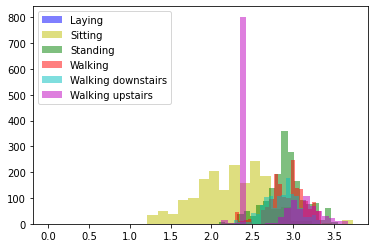

In [202]:


laying = train_data.loc[train_data.Activity == "LAYING", "tGravityAcc-mean()-Y"]
sitting = train_data.loc[train_data.Activity == "SITTING", "tGravityAcc-mean()-Y"]
standing = train_data.loc[train_data.Activity == "STANDING", "tGravityAcc-mean()-Y"]
walking = train_data.loc[train_data.Activity == "WALKING", "tGravityAcc-mean()-Y"]
walking_downstairs = train_data.loc[train_data.Activity == "WALKING_DOWNSTAIRS", "tGravityAcc-mean()-Y"]
walking_upstairs = train_data.loc[train_data.Activity == "WALKING_UPSTAIRS", "tGravityAcc-mean()-Y"]

kwargs = dict(alpha=0.5, bins=20)

plt.hist(laying, **kwargs, color="b", label="Laying")
plt.hist(sitting, **kwargs, color="y", label="Sitting")
plt.hist(standing, **kwargs, color="g", label="Standing")
plt.hist(walking, **kwargs, color="r", label="Walking")
plt.hist(walking_downstairs, **kwargs, color="c", label="Walking downstairs")
plt.hist(walking_upstairs, **kwargs, color="m", label="Walking upstairs")

plt.legend()

In [94]:
set(train_data.loc[train_data["angle(X,gravityMean)"] > -1.554, "Activity"])

{'LAYING'}

In [30]:
!pip install shap

     |████████████████████████████████| 358kB 9.7MB/s 
  Created wheel for shap: filename=shap-0.39.0-cp37-cp37m-linux_x86_64.whl size=491629 sha256=ae9b86eaf1bc80ff7c761b687cbd41d8ac0708de5eaf9796e95b731794d5a8e4
  Stored in directory: /root/.cache/pip/wheels/15/27/f5/a8ab9da52fd159aae6477b5ede6eaaec69fd130fa0fa59f283
Successfully built shap


In [203]:


explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test2)
shap.initjs()

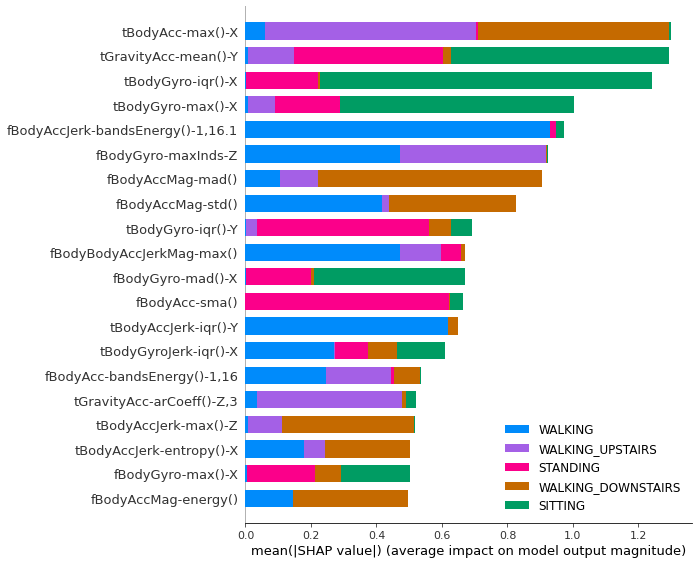

In [205]:
shap.summary_plot(shap_values, X_test2, class_names=model.classes_)

In [204]:
model.classes_

array(['SITTING', 'STANDING', 'WALKING', 'WALKING_DOWNSTAIRS',
       'WALKING_UPSTAIRS'], dtype=object)

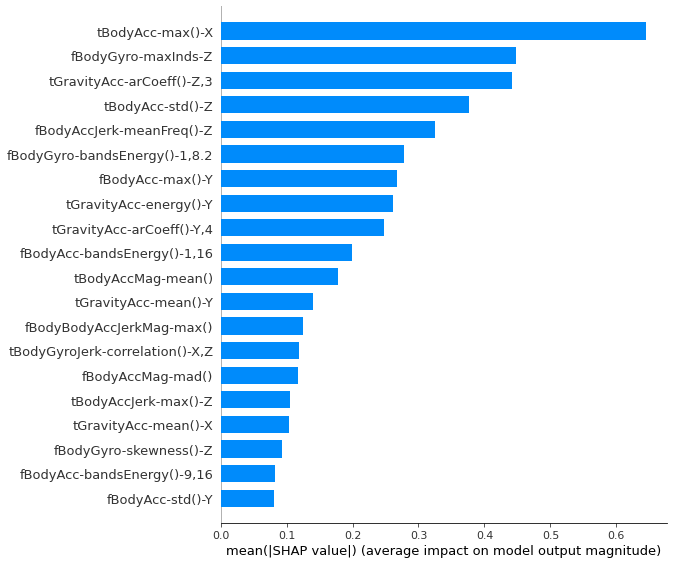

In [210]:
shap.summary_plot(shap_values[4], X_test2, class_names=model.classes_, plot_type="bar")

In [ ]:
shap.summary_plot(shap_values, X_test2, class_names=model.classes_)

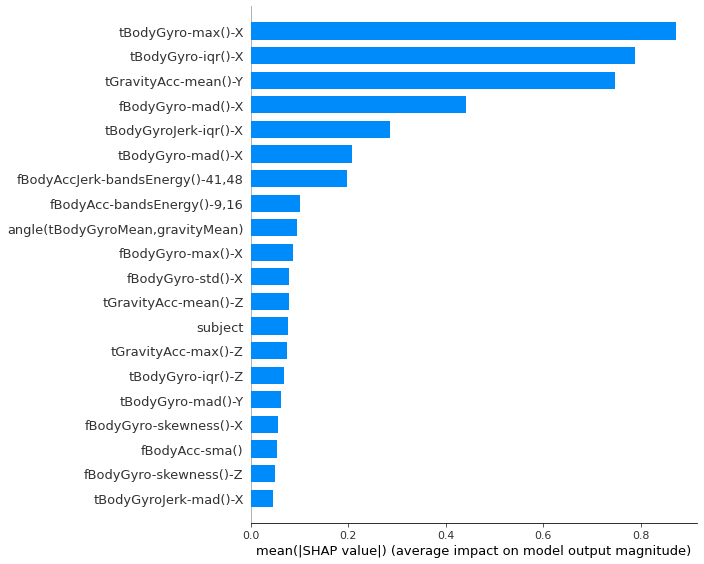

In [138]:
shap.summary_plot(shap_values[0], X_test, plot_type="bar")

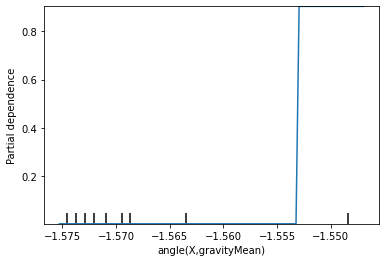

In [66]:


plot_partial_dependence(model, X_test, ["angle(X,gravityMean)"], target="LAYING") 

In [72]:
X_test["angle(X,gravityMean)"].head()

1239    -1.574634
2411    -1.568077
10807   -1.548333
6251    -1.568669
8904    -1.571023
Name: angle(X,gravityMean), dtype: float64

In [73]:
y_test.head()

1239              SITTING
2411     WALKING_UPSTAIRS
10807              LAYING
6251     WALKING_UPSTAIRS
8904              WALKING
Name: Activity, dtype: object

In [74]:
X.columns

Index(['angle(X,gravityMean)', 'angle(Y,gravityMean)', 'angle(Z,gravityMean)',
       'angle(tBodyAccJerkMean),gravityMean)', 'angle(tBodyAccMean,gravity)',
       'angle(tBodyGyroJerkMean,gravityMean)',
       'angle(tBodyGyroMean,gravityMean)', 'energy-mean()',
       'fBodyAcc-bandsEnergy()-1,16', 'fBodyAcc-bandsEnergy()-1,16.1',
       ...
       'tGravityAccMag-energy()', 'tGravityAccMag-entropy()',
       'tGravityAccMag-iqr()', 'tGravityAccMag-mad()', 'tGravityAccMag-max()',
       'tGravityAccMag-mean()', 'tGravityAccMag-min()', 'tGravityAccMag-sma()',
       'tGravityAccMag-std()', 'void()'],
      dtype='object', length=571)

In [139]:
df = train_data.sample(100)

In [140]:
df = df.sort_values("Activity")

In [141]:
df_X = df.iloc[:,2:]
df_y = df["Activity"]

In [142]:
shap_values = explainer.shap_values(df_X)

In [144]:
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0], df_X)

In [145]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], df_X)

In [143]:
shap.initjs()
shap.force_plot(explainer.expected_value[2], shap_values[2], df_X)

In [146]:
shap.initjs()
shap.force_plot(explainer.expected_value[3], shap_values[3], df_X)

In [147]:
shap.initjs()
shap.force_plot(explainer.expected_value[4], shap_values[4], df_X)